<a href="https://colab.research.google.com/github/PaulToronto/Applied-Geospatial-Data-Science-with-Python---Book/blob/main/2_1_Introduction_to_Contextily.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Contextily

## Imports

In [1]:
!pip install contextily

In [2]:
!pip install geodatasets

In [3]:
import matplotlib.pyplot as plt
import geopandas as gpd

import rasterio as rio
from rasterio.plot import show as rioshow

import contextily as cx

from pyproj import Transformer

# some geodatasets here
from geodatasets import get_path

In [4]:
from google.colab import drive

drive.mount('/content/gdrive')

drive_path = '/content/gdrive/MyDrive/Colab Notebooks/Data Science/Applied Geospatial Data Science with Python - Book/data/'

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## Delineation of urban areas in Spain

In [5]:
data_url = 'https://ndownloader.figshare.com/files/20232174'

In [6]:
# spain = gpd.read_file(data_url)
spain = gpd.read_file(drive_path + 'sp_blg_adbscan_city_boundaries_v1.gpkg')
spain.shape

(717, 3)

In [7]:
spain.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   city_id      717 non-null    object  
 1   n_buildings  717 non-null    int64   
 2   geometry     717 non-null    geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 16.9+ KB


In [8]:
spain.head(1)

,city_id,n_buildings,geometry
0,ci000,2348,"POLYGON ((385390.071 4202949.446, 384488.697 4..."


In [9]:
spain.crs

<Projected CRS: EPSG:25830>
Name: ETRS89 / UTM zone 30N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 6°W and 0°W: Faroe Islands offshore; Ireland - offshore; Jan Mayen - offshore; Norway including Svalbard - offshore; Spain - onshore and offshore.
- bounds: (-6.0, 35.26, 0.01, 80.49)
Coordinate Operation:
- name: UTM zone 30N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

- the simplest way to access `contextily` and get a background map to go with your geographic data is to use the `add_basemap` method

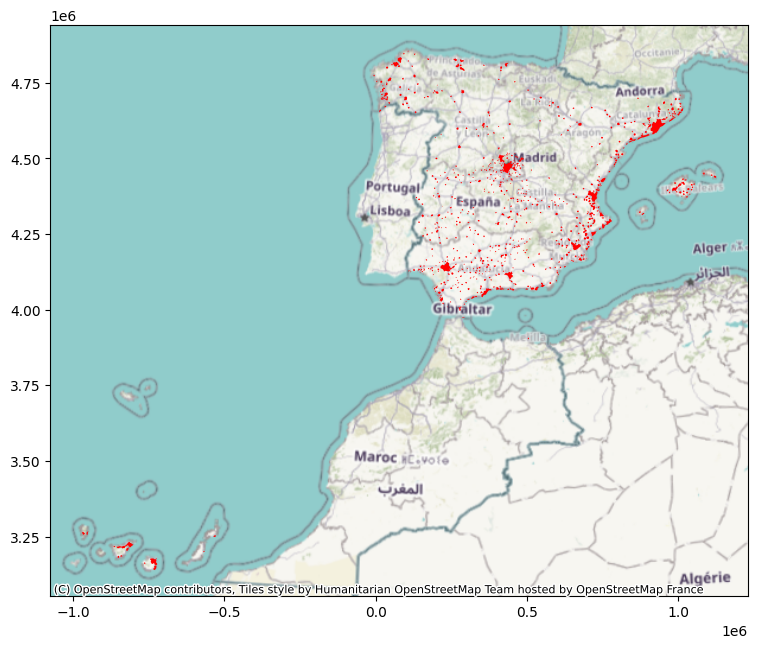

In [10]:
ax = spain.plot(color='red', figsize=(9, 9))
cx.add_basemap(ax, crs=spain.crs)

## Providers

- there are a lot of providers to choose from so you can easily switch between backgrounds

In [11]:
zaragoza = spain.query("city_id == 'ci122'")
zaragoza

,city_id,n_buildings,geometry
112,ci122,23604,"POLYGON ((672442.171 4608117.375, 672413.234 4..."


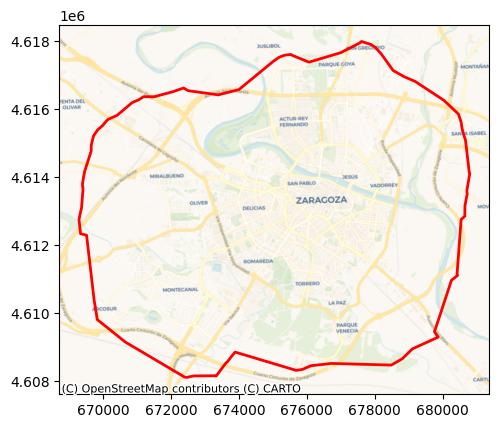

In [12]:
ax = zaragoza.plot(facecolor='none',
                   edgecolor='red',
                   linewidth=2)

cx.add_basemap(ax,
               crs=zaragoza.crs,
               source=cx.providers.CartoDB.Voyager)

- the source of these provider tiles is `xyzservices`: https://xyzservices.readthedocs.io/en/stable/
- they come as `xyzservices.Bunch` objects with make them easy to explore with Python
- you can pass predefined tile providers from the `contextily.providers` module or any other `xyzservices.TileProvider`
- the docs: https://xyzservices.readthedocs.io/en/stable/index.html

In [13]:
# cx.providers

In [14]:
# cx.providers.OpenStreetMap

## Coordinate-based searches

- here you need a bounding box of coordinates to access tiles
- this bounding box needs to be expressed either in Web (Spherical) Mercator or longitude and latitude (WGS84)
    - that is what gets returned as the second value by `cx.bounds2img`

### Toronto Example

In [15]:
toronto = cx.Place('Toronto', zoom=10)
toronto.bbox_map

(-8883817.175416324, -8805545.658452304, 5361598.9120354, 5479006.187481432)

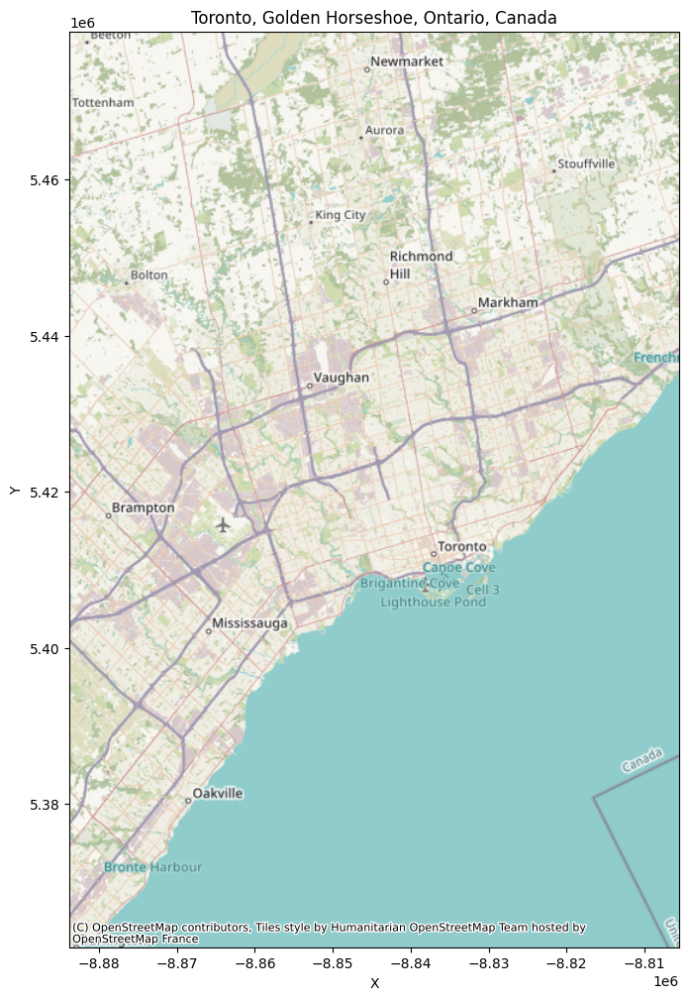

In [16]:
ax = toronto.plot()
ax.axis('on');

In [17]:
cx.bounds2img

<function contextily.tile.bounds2img(w, s, e, n, zoom='auto', source=None, ll=False, wait=0, max_retries=2, n_connections=1, use_cache=True, zoom_adjust=None)>

In [18]:
trnto_img, trnto_ext = cx.bounds2img(#toronto.w,
                                     #toronto.s,
                                     #toronto.e,
                                     #toronto.n,
                                     *toronto.bbox,
                                     ll=True,
                                     source=cx.providers.CartoDB.Voyager)

type(trnto_img), type(trnto_ext)

(numpy.ndarray, tuple)

In [19]:
trnto_img.shape # 3-dimensional array with the image colors

(1024, 1024, 4)

In [20]:
trnto_ext, toronto.bbox_map

((-8883817.175416324,
  -8805545.658452304,
  5381166.791276407,
  5459438.308240427),
 (-8883817.175416324, -8805545.658452304, 5361598.9120354, 5479006.187481432))

In [21]:
# note that I fed cx.bounds2img the numbers for toronto.bbox
# but it returned trnto_ext which is toronto.bbox_map
toronto.w, toronto.s, toronto.e, toronto.n, toronto.bbox

(-79.6392832,
 43.5796082,
 -79.1132193,
 43.8554425,
 [-79.6392832, 43.5796082, -79.1132193, 43.8554425])

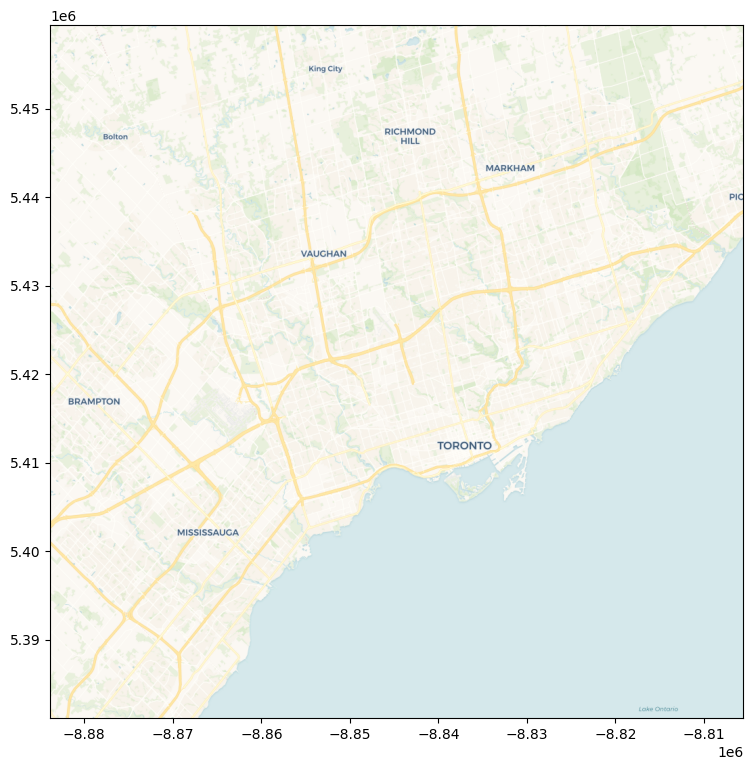

In [22]:
f, ax = plt.subplots(1, figsize=(9, 9))
ax.imshow(trnto_img, extent=trnto_ext);

### Ghent (Belgium) Example

In [23]:
# bounding box for Ghent
west, south, east, north = (
    3.616218566894531,
    50.98912458110244,
    3.8483047485351562,
    51.13994019806845
    )

In [24]:
ghent_img, ghent_ext = cx.bounds2img(
    west,
    south,
    east,
    north,
    ll=True,
    source=cx.providers.CartoDB.Voyager
)

In [25]:
ghent_ext

(401141.5244406049, 430493.34330211265, 6613943.183459732, 6653078.941941739)

In [26]:
ghent_img.shape

(1024, 768, 4)

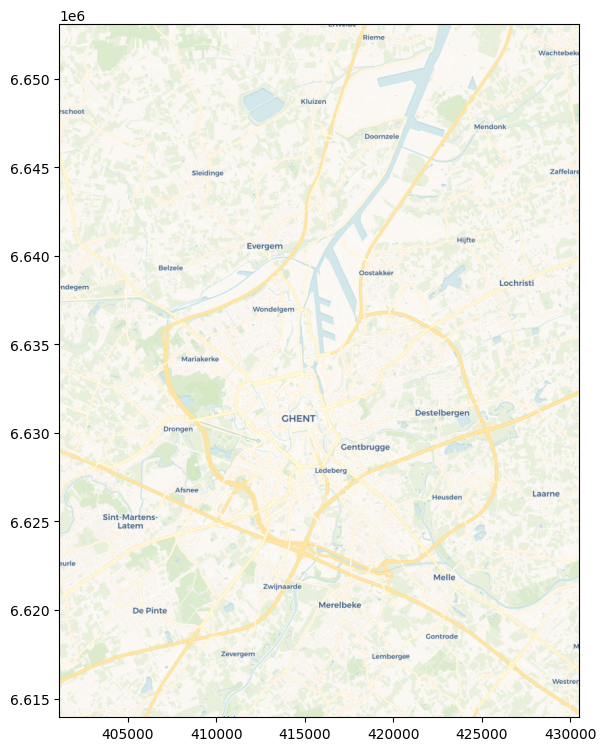

In [27]:
f, ax = plt.subplots(1, figsize=(9, 9))
ax.imshow(ghent_img, extent=ghent_ext);

## Places: `contextily.Place`

In [28]:
nightlights = cx.providers.NASAGIBS.ViirsEarthAtNight2012
ireland = cx.Place('Ireland', source=nightlights)

In [29]:
ireland

Place : Éire / Ireland | n_tiles: 1 | zoom : 8 | im : (1536, 1024)

In [30]:
type(ireland)

contextily.place.Place

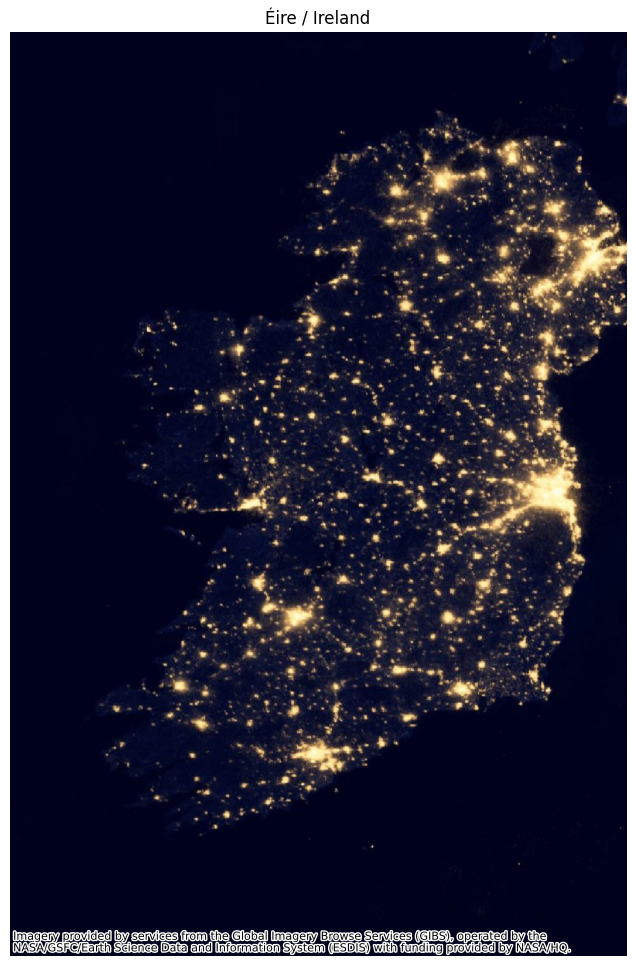

In [31]:
ireland.plot();

## Store basemaps locally

- In a given session, each tile is only downloaded once and stored in a temporary cache

In [32]:
%time tempe = cx.Place('Tempe, AZ')

CPU times: user 1.61 s, sys: 53.1 ms, total: 1.67 s
Wall time: 13.1 s


In [33]:
%time tempe = cx.Place('Tempe, AZ')

CPU times: user 245 ms, sys: 11.1 ms, total: 256 ms
Wall time: 2.8 s


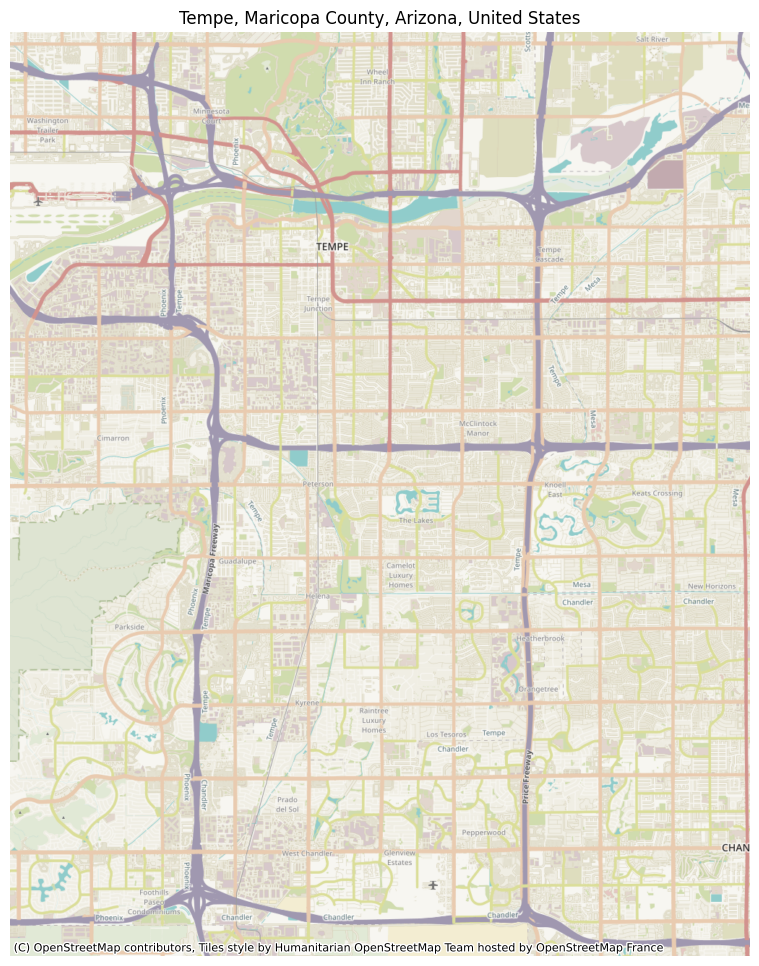

In [34]:
tempe.plot();

- `contextily` lets you download basemaps and store them in standard raster files, that you can open in Python or any other GIS
- there are a number of ways to save these files, one way is through the Places aPI (using path)

In [35]:
bristol = cx.Place('Bristol, UK', path=drive_path + 'bristol.tif')

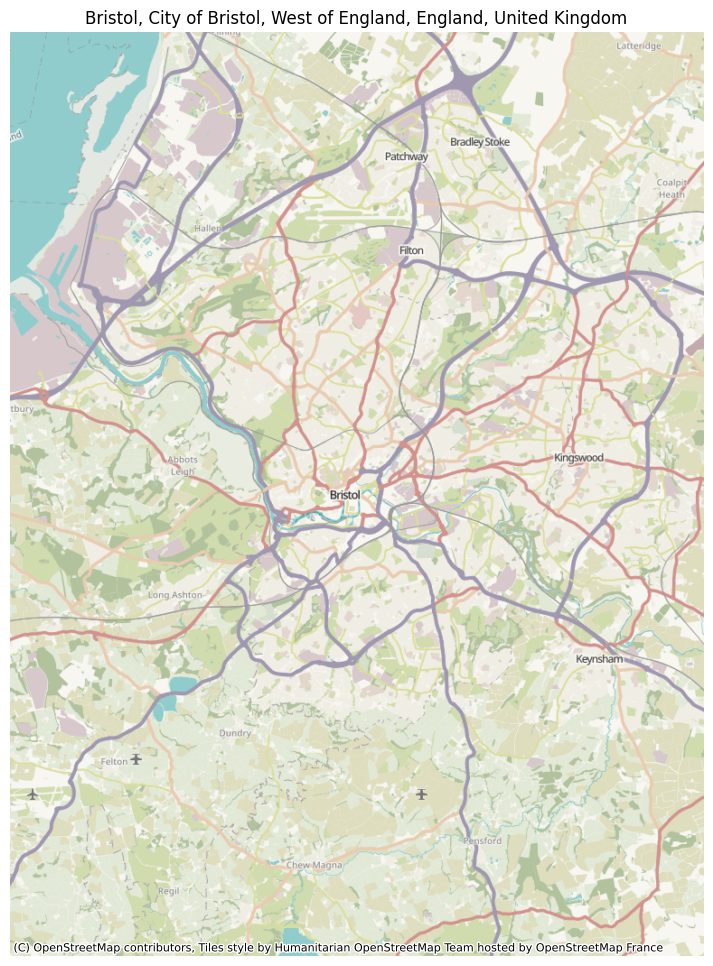

In [36]:
# you can still use it this way
bristol.plot();

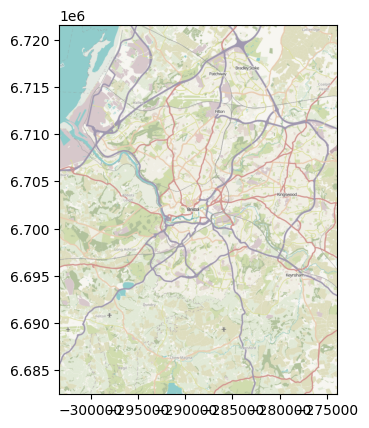

In [37]:
# or you can retrieve it from the file
with rio.open(drive_path + 'bristol.tif') as r:
    rioshow(r)

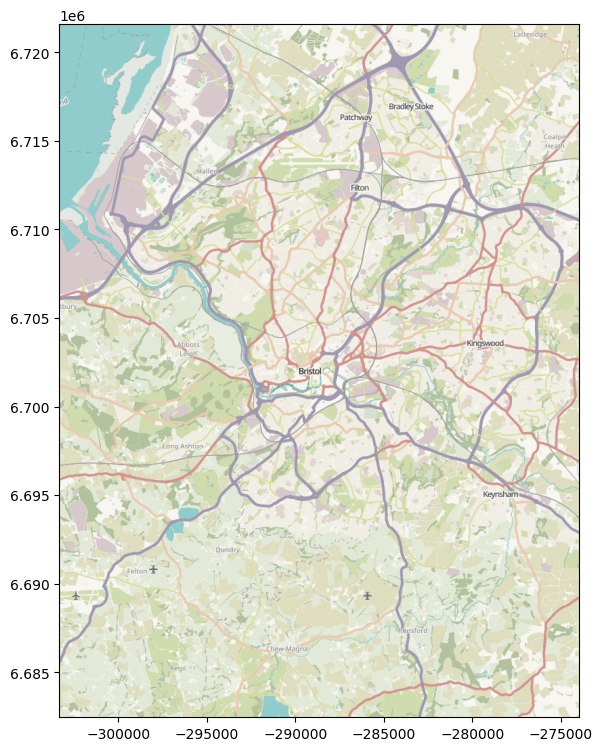

In [38]:
f, ax = plt.subplots(1, figsize=(9, 9))

with rio.open(drive_path + 'bristol.tif') as r:
    rioshow(r, ax=ax)

- another way to display this image is to use `cx.bounds2img`'s siter method: `cx.bounds2raster`

In [39]:
_ = cx.bounds2raster(*bristol.bbox,
                     ll=True,
                     path=drive_path + 'bristol2.tif',
                     source=cx.providers.CartoDB.Positron)

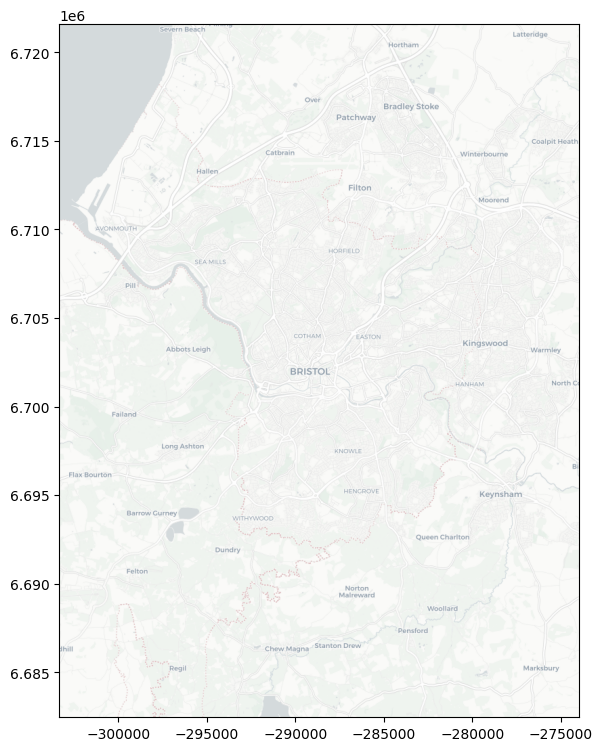

In [40]:
f, ax = plt.subplots(1, figsize=(9, 9))

with rio.open(drive_path + 'bristol2.tif') as r:
    rioshow(r, ax=ax)

## Plotting points defined by latitude and longitude on a contextily base map

### Example when starting with lon/lat

In [41]:
# first review of zip function
my_list = ['abc', (1, 2, 3), (100, 200, 300)]
list(zip(my_list[0], my_list[1], my_list[2]))

[('a', 1, 100), ('b', 2, 200), ('c', 3, 300)]

In [42]:
# Define latitude and longitude points
lat_lons = [
    (51.5074, -0.1278),  # London
    (48.8566, 2.3522),   # Paris
    (40.7128, -74.0060)  # New York City
]

# Transformer to convert lat/lon to Web Mercator
transformer = Transformer.from_crs('epsg:4326', 'epsg:3857', always_xy=False)

mercator_coords = [transformer.transform(lat, lon) for lat, lon in lat_lons]
mercator_coords

[(-14226.630923380362, 6711542.475587634),
 (261845.70624393807, 6250564.349543125),
 (-8238310.235647004, 4970071.579142427)]

In [43]:
# notice the order has switched
# lat, lon becomes lon, lat
x, y = zip(*mercator_coords)

In [44]:
x, y

((-14226.630923380362, 261845.70624393807, -8238310.235647004),
 (6711542.475587634, 6250564.349543125, 4970071.579142427))

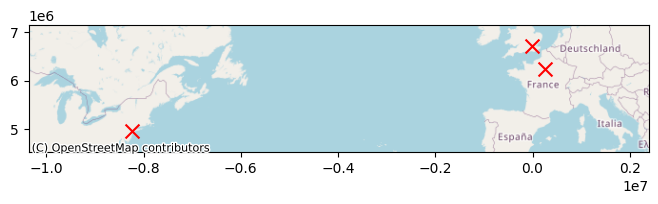

In [45]:
f, ax = plt.subplots(figsize=(8, 8))

ax.scatter(x, y, color='red', s=100, marker='x')

padding = 0.25 # 25% padding
x_min, x_max = min(x), max(x)
y_min, y_max = min(y), max(y)

x_range = x_max - x_min
y_range = y_max - y_min

ax.set_xlim(x_min - padding * x_range, x_max + padding * x_range)
ax.set_ylim(y_min - padding * y_range, y_max + padding * y_range)

# best to set limits before adding the basemap
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)

plt.show()

### Example when starting with a contextily `Place`

- Note the use of the `always_xy` parameter in the `Transformer.from_crs` function, which is unlike how it was done in the previous example

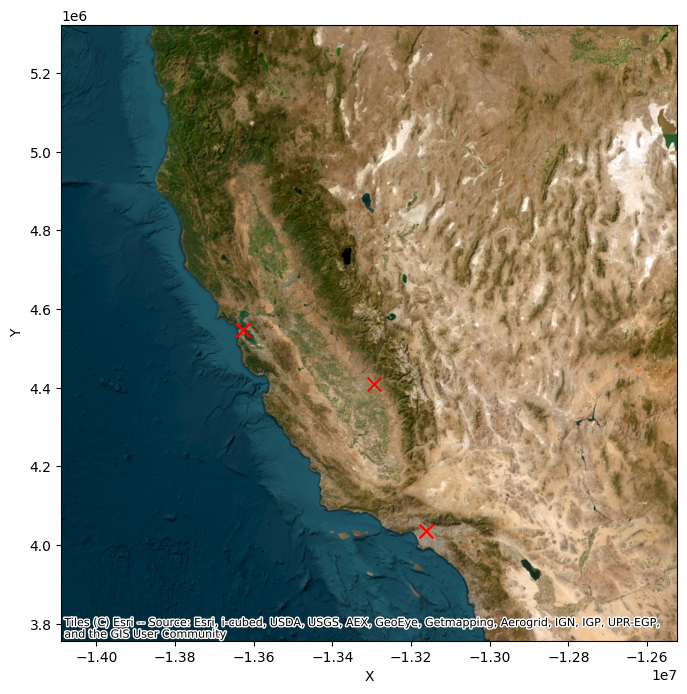

In [46]:
# Define points in California (latitude, longitude)
california_points = [
    (34.0522, -118.2437),  # Los Angeles
    (37.7749, -122.4194),  # San Francisco
    (36.7783, -119.4179)   # Central California (approximate)
]

# Transformer to convert lat/lon to Web Mercator
transformer = Transformer.from_crs('epsg:4326', 'epsg:3857', always_xy=True)

# because `always_xy=True` the lat, lon needed to be reversed here
x, y = zip(*[transformer.transform(lon, lat) for lat, lon in california_points])

#create a Place object for California
ca = cx.Place('California',
              #zoom_adjust=-1,
              source=cx.providers.Esri.WorldImagery)

fig, ax = plt.subplots(figsize=(8, 8), dpi=100)

ca.plot(ax=ax)

ax.scatter(x, y, color='red', s=100, marker='x')

plt.show()

## Fine tune zoom levels

- Usually, `contextily` will automatically figure out an appropriate zoom level

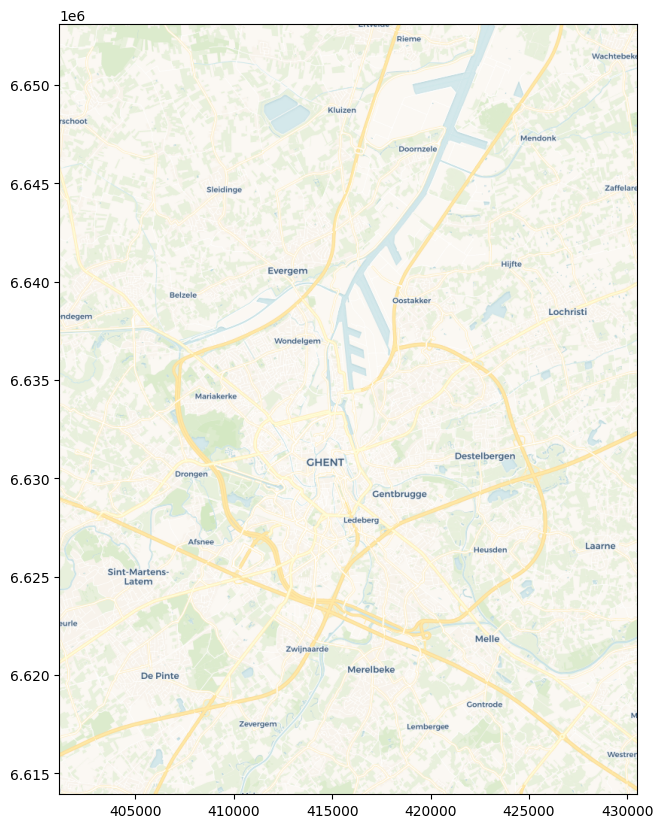

In [47]:
fig, ax = plt.subplots(1, figsize=(10, 10))
plt.imshow(ghent_img, extent=ghent_ext);

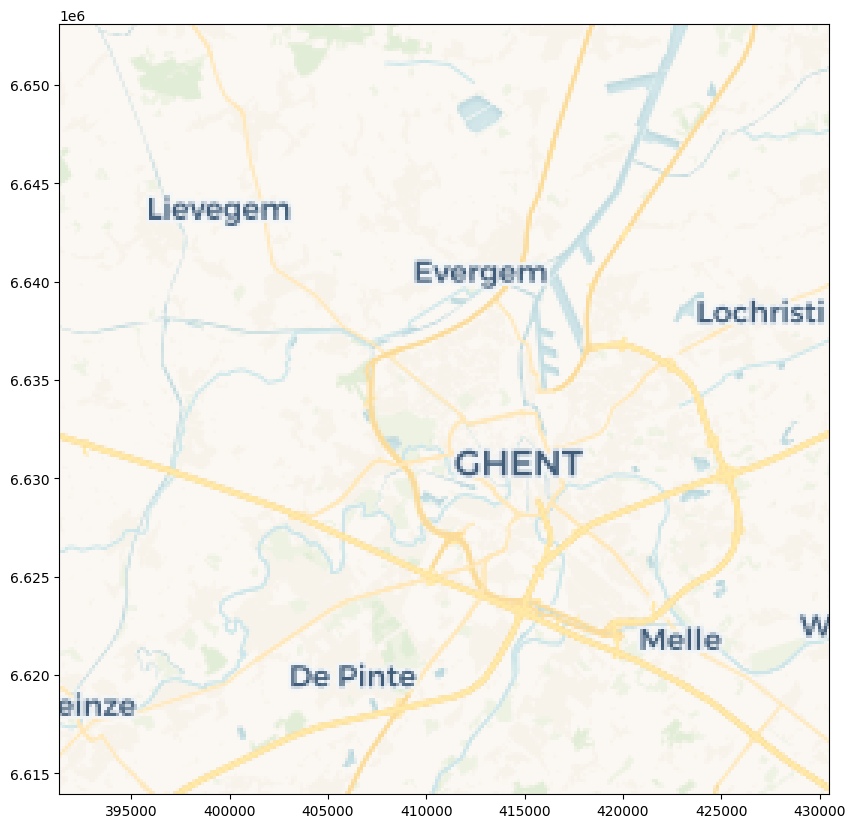

In [48]:
ghent_img, ghent_ext = cx.bounds2img(
    west,
    south,
    east,
    north,
    ll=True,
    source=cx.providers.CartoDB.Voyager,
    zoom=10
)

fig, ax = plt.subplots(1, figsize=(10, 10))
plt.imshow(ghent_img, extent=ghent_ext);

- You can peak at the automatic level calculated

In [49]:
cx.tile._calculate_zoom(west, south, east, north)

12

- You can also determine the number of tiles for a particular zoom level

In [50]:
cx.howmany(west, south, east, north, 12, ll=True)

Using zoom level 12, this will download 12 tiles


12

In [51]:
cx.howmany(west, south, east, north, 13, ll=True)

Using zoom level 13, this will download 36 tiles


36

## Using transparent layers

In [52]:
gpd.datasets.available

['naturalearth_cities', 'naturalearth_lowres', 'nybb']

In [53]:
df = gpd.read_file(get_path('nybb')).to_crs('epsg:3857')

Extracting 'nybb_16a/nybb.shp' from '/root/.cache/geodatasets/nybb_16a.zip' to '/root/.cache/geodatasets/nybb_16a.zip.unzip'
Extracting 'nybb_16a/nybb.shx' from '/root/.cache/geodatasets/nybb_16a.zip' to '/root/.cache/geodatasets/nybb_16a.zip.unzip'
Extracting 'nybb_16a/nybb.dbf' from '/root/.cache/geodatasets/nybb_16a.zip' to '/root/.cache/geodatasets/nybb_16a.zip.unzip'
Extracting 'nybb_16a/nybb.prj' from '/root/.cache/geodatasets/nybb_16a.zip' to '/root/.cache/geodatasets/nybb_16a.zip.unzip'


In [54]:
df.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [55]:
df.head()

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((-8243264.851 4948597.836, -824..."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((-8219461.925 4952778.732, -821..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((-8222843.672 4950893.793, -822..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((-8238858.864 4965915.024, -823..."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((-8226155.130 4982269.949, -822..."


In [56]:
df['BoroName'].value_counts()

BoroName
Staten Island    1
Queens           1
Brooklyn         1
Manhattan        1
Bronx            1
Name: count, dtype: int64

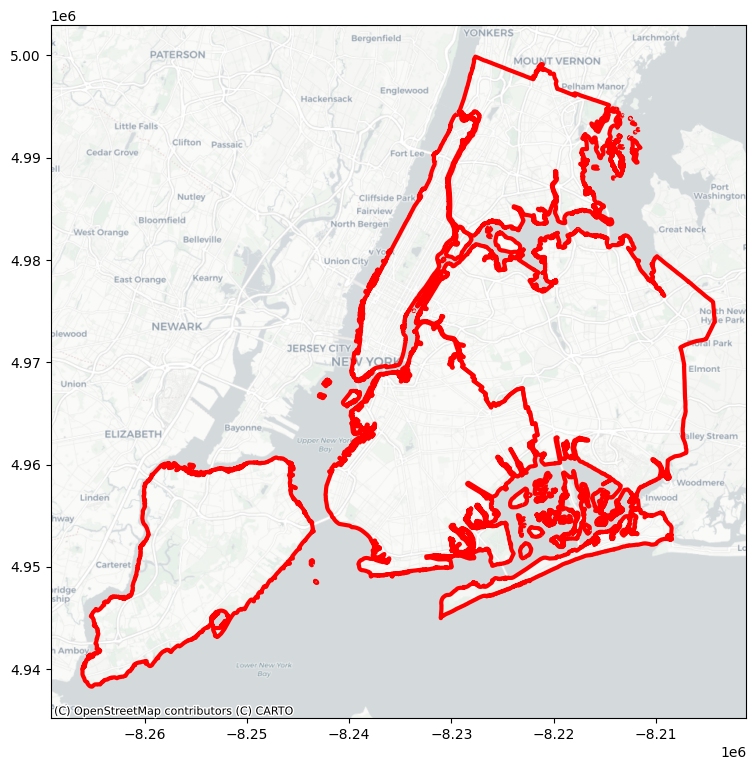

In [57]:
ax = df.plot(figsize=(9, 9), color='none', edgecolor='r', linewidth=3)
cx.add_basemap(ax, crs=df.crs.to_string(), source=cx.providers.CartoDB.Positron)

- Note that in the above plot, some map elements are obscured by the data
- Below is solution
    - this solution only works if the tile provider makes partially transparent tiles available
    - `contextily` will do it's best to auto-detect these transparent layers and put them on top

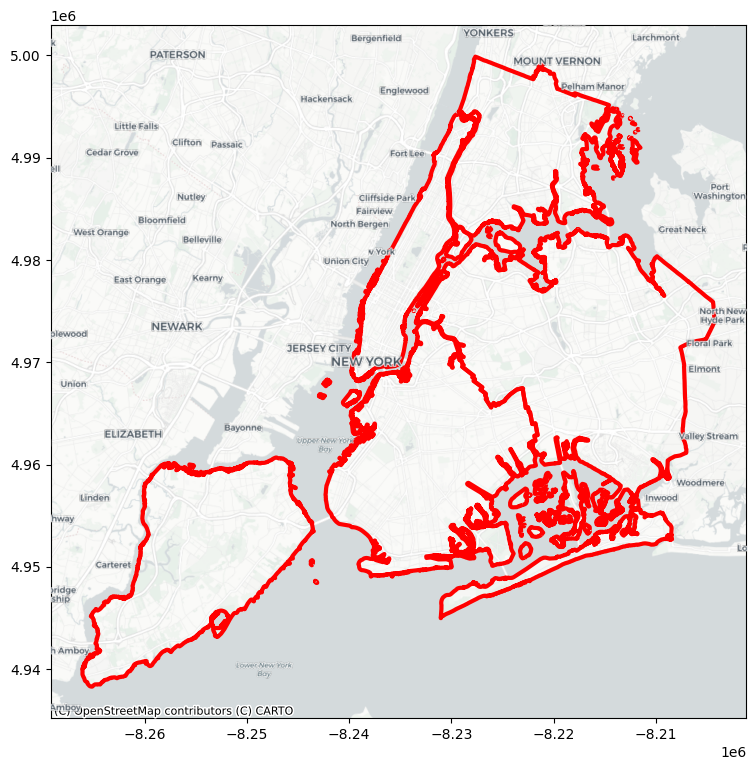

In [58]:
ax = df.plot(figsize=(9, 9), color='none', edgecolor='r', linewidth=3)
cx.add_basemap(ax, crs=df.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax, crs=df.crs, source=cx.providers.CartoDB.PositronOnlyLabels)

- You can also set different zoom levels for the layers

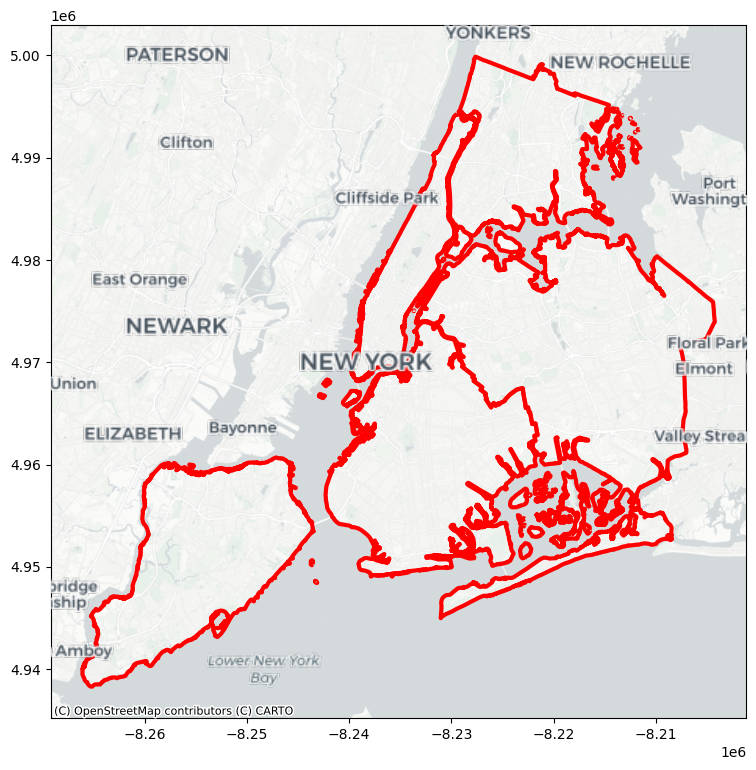

In [59]:
ax = df.plot(figsize=(9, 9), color='none', edgecolor='r', linewidth=3)
cx.add_basemap(ax, crs=df.crs, source=cx.providers.CartoDB.PositronNoLabels, zoom=12)
cx.add_basemap(ax, crs=df.crs, source=cx.providers.CartoDB.PositronOnlyLabels, zoom=10)